## About

The United States' **National UFO Research Center** NUFORC collects and serves over 100,000 reports of UFO sightings.

The dataset has been extracted from a the raw report in .json format that contains the information exactly as it appears on the NUFORC website, including the sighting time, location, duration, and other attributes.

## Questions to Answer

Through the analysis of the available data, I will try answering to the following questions:

1. Which is the most common UFO shape seen?
2. Where do most of the UFO sightings happen (in which state)?
3. Which are the states with the most UFO sightings per capita?
4. What is the year with most sightings?
5. In what time of the year (month) do people report seeing more UFOs?
6. And in what time of the day?
7. Are there patterns in the sightings descripions?

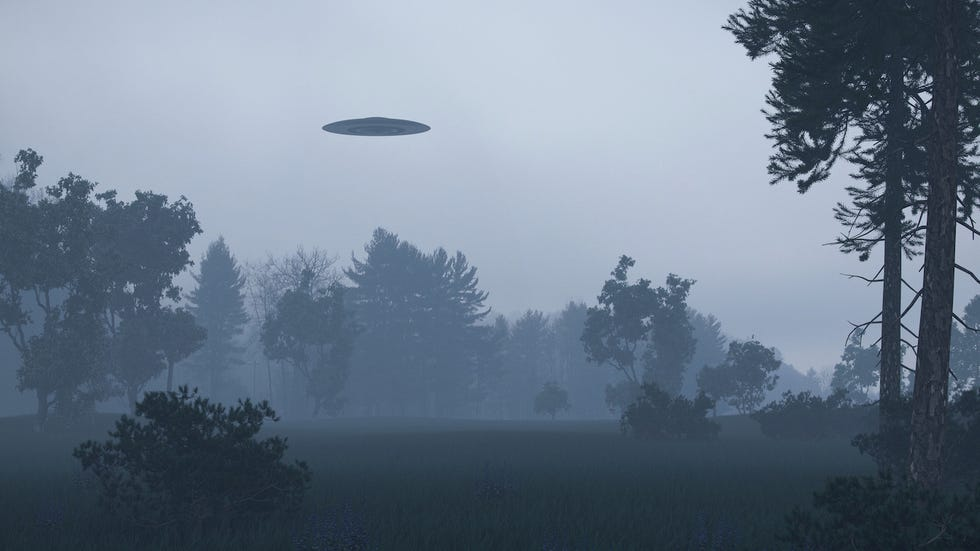

## Preliminary Steps

In [902]:
# Import libraries
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime
import calendar
import re
import string
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [842]:
# Open json and convert it into dataframe
data = [json.loads(line) for line in open('nuforc_reports.json', 'r')]
df = pd.DataFrame.from_dict(data, orient='columns')
df.head()

,text,stats,date_time,report_link,city,state,shape,duration,summary,posted
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,5/6/21 21:00,http://www.nuforc.org/webreports/163/S163041.html,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,None,http://www.nuforc.org/webreports/151/S151813.html,Somerset,KY,Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,http://www.nuforc.org/webreports/163/S163175.html,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,7/6/05 12:00,http://www.nuforc.org/webreports/162/S162867.html,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,1/29/20 19:45,http://www.nuforc.org/webreports/152/S152953.html,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20


## Data Wrangling & EDA

In [843]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98353 entries, 0 to 98352
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   text         98316 non-null  object
 1   stats        98316 non-null  object
 2   date_time    98251 non-null  object
 3   report_link  98353 non-null  object
 4   city         98062 non-null  object
 5   state        92707 non-null  object
 6   shape        94682 non-null  object
 7   duration     93961 non-null  object
 8   summary      98305 non-null  object
 9   posted       98353 non-null  object
dtypes: object(10)
memory usage: 7.5+ MB


In [844]:
# Remove unnecessary column
df = df.drop(['report_link'], axis=1)
df.head()

,text,stats,date_time,city,state,shape,duration,summary,posted
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,5/6/21 21:00,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,None,Somerset,KY,Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,7/6/05 12:00,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,1/29/20 19:45,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20


In [845]:
# Calculate perentage of null values
def missing_percentage(dataframe):
    total_nulls = dataframe.isnull().sum().sort_values(ascending=False)
    total_percent = (total_nulls/dataframe.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total Nulls', 'Percentage'])
    return missing_data

In [846]:
missing_percentage(df)

,Total Nulls,Percentage
state,5646,0.057405
duration,4392,0.044655
shape,3671,0.037325
city,291,0.002959
date_time,102,0.001037
summary,48,0.000488
text,37,0.000376
stats,37,0.000376
report_link,0,0.000000
posted,0,0.000000


In [847]:
# Extract date and time of sightings
df['datetime'] = pd.to_datetime(df['date_time'], errors='coerce')
df['date'] = df['datetime'].dt.date
df['time'] = df['datetime'].dt.time

df = df.drop(['date_time', 'datetime'], axis=1)
df.head()

,text,stats,city,state,shape,duration,summary,posted,date,time
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21,2021-05-06,21:00:00
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,Somerset,KY,Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19,NaT,NaT
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21,NaT,NaT
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21,2005-07-06,12:00:00
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20,2020-01-29,19:45:00


In [848]:
df['shape'].unique()

array(['Sphere', 'Unknown', None, 'Formation', 'Light', 'Fireball',
       'Triangle', 'Rectangle', 'Flash', 'Changing', 'Disk', 'Circle',
       'Cigar', 'Other', 'Oval', 'Cone', 'Egg', 'Chevron', 'Cylinder',
       'Diamond', 'Cross', 'Teardrop', 'TRIANGULAR'], dtype=object)

In [849]:
# Standardize shape capitalization and merge similar shapes
df['shape'] = df['shape'].str.replace('TRIANGULAR','Triangle')
df['shape'] = df['shape'].str.replace('Circle','Sphere')
df['shape'] = df['shape'].str.replace('Egg','Oval')
df['shape'] = df['shape'].str.replace('Cigar','Cylinder')
df['shape'] = df['shape'].str.replace('Flash','Light')
df['shape'] = df['shape'].str.replace('Fireball','Light')
df['shape'] = df['shape'].str.replace('Teardrop', 'Cone')
df['shape'] = df['shape'].str.replace('Unknown', 'Other')

In [850]:
df['shape'].unique()

array(['Sphere', 'Other', None, 'Formation', 'Light', 'Triangle',
       'Rectangle', 'Changing', 'Disk', 'Cylinder', 'Oval', 'Cone',
       'Chevron', 'Diamond', 'Cross'], dtype=object)

In [851]:
# Change column name to unify both unknown and other shapes
df['shape'] = df['shape'].str.replace('Other', 'Other/Unknown')

### Shapes

In [852]:
# Frequency table
pd.crosstab(index=df['shape'], columns='count').sort_values('count', ascending=False)

col_0,count
shape,
Light,29799
Sphere,18051
Other/Unknown,13097
Triangle,8557
Disk,4950
Oval,4949
Cylinder,3745
Formation,3420
Changing,2370


In [853]:
# Plot histogram
fig = px.histogram(df, x='shape').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

Most respondents report seeing a **light**, which isn't an actual shape.

Moreover 13,097 sightings don't have a clearly defined shape, or this is **unknown** for the respondent, so we will exclude this segment for this analysis.

Having said that, the 5 most common identified shapes are:
- **Spheres** (18,051)
- **Triangles** (8,557)
- **Disks** (4,950) and **ovals** (4,949) at almost the same rank
- **Cylinders** (3,745)

### States

In [854]:
# Frequency table
freq = pd.crosstab(index=df['state'], columns='count').sort_values('count', ascending=False)
freq.head(10)

col_0,count
state,
CA,10397
FL,5879
WA,4386
TX,3881
NY,3859
PA,3545
AZ,3228
OH,3027
IL,2772


In [855]:
# Plot histogram
fig = px.histogram(df, x='state').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

The top 10 for the highest absolute number of UFO sightings is the following:

1. **California**	(10,397)
2. **Florida**	(5,879)
3. **Washington**	(4,386)
4. Texas	(3,881)
5. New York	(3,859)
6. Pennsylvania	(3,545)
7. Arizona	(3,228)
8. Ohio	(3,027)
9. Illinois	(2,772)
10. North Carolina	(2,649)

### Sightings per capita

In [856]:
# Open file with US population
pop = pd.read_excel('2020Population.xlsx',)
pop.head()

,state,population
0,AL,5024279
1,AK,733391
2,AZ,7151502
3,AR,3011524
4,CA,39538223


In [857]:
# Merge datasets of frequency and population
spc = pd.merge(freq, pop, on='state')
spc.head()

,state,count,population
0,CA,10397,39538223
1,FL,5879,21538187
2,WA,4386,7705281
3,TX,3881,29145505
4,NY,3859,20201249


In [858]:
# Calculate sightings per 100,000 inhabitants
spc['per capita'] = round(((spc['count']/spc['population']) * 100000), 2)
spc.sort_values('per capita', ascending=False).head(10)

,state,count,population,per capita
43,VT,462,643077,71.84
38,MT,722,1084225,66.59
32,NH,866,1377529,62.87
44,AK,451,733391,61.50
34,ME,833,1362359,61.14
2,WA,4386,7705281,56.92
11,OR,2332,4237256,55.04
29,ID,1008,1839106,54.81
26,NM,1148,2117522,54.21
48,WY,269,576851,46.63


In [859]:
# Plot histogram
plt.rcParams['figure.figsize'] = 21,7
fig = px.bar(spc, x='state', y='per capita').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

The states with the highest number of UFO sightings per capita are the following. The per capita value is to be considered per 100,000 inhabitants. For example, 72 people in Vermont per every 100,000 people have reported seeing an UFO.

1. **Vermont** (71.84)
2. **Montana**	(66.59)
3. **New Hampshire**	(62.87)
4. Alaska	(61.50)
5. Maine	(61.14)
6. Washington	(56.92)
7. Oregon	(55.04)
8. Idaho	(54.81)
9. New Mexico	(54.21)
10. Wyoming	(46.63)

As we can see, the ranking is completely different from the previous one, with the most sightings overall.

### Year

In [872]:
# Extract year from date
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['year'] = df['year'].fillna(0.0).astype(int)
df.head()

,text,stats,city,state,shape,duration,summary,posted,date,time,year,month,month_name
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21,2021-05-06,21:00:00,2021,05,May
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,Somerset,KY,Other/Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19,NaT,NaT,0,NaN,NaN
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21,NaT,NaT,0,NaN,NaN
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21,2005-07-06,12:00:00,2005,07,Jul
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20,2020-01-29,19:45:00,2020,01,Jan


In [873]:
# Exclude null years and years over 2021 (yes, there are some. weird!)
yy = df[(df['year'] > 1) & (df['year'] < 2022)]
yy.head()

,text,stats,city,state,shape,duration,summary,posted,date,time,year,month,month_name
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21,2021-05-06,21:00:00,2021,05,May
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21,2005-07-06,12:00:00,2005,07,Jul
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20,2020-01-29,19:45:00,2020,01,Jan
5,Meteor or space junk? There have been several...,Occurred : 1/29/2020 20:10 (Entered as : 1/29...,San Diego,CA,Light,2 seconds,meteor or space junk?,1/31/20,2020-01-29,20:10:00,2020,01,Jan
6,"Shaped like a triangle, transparent like a lig...",Occurred : 1/28/2020 15:30 (Entered as : 01/2...,Las Vegas,NV,Triangle,30,"Shaped like a triangle, transparent like a lig...",1/31/20,2020-01-28,15:30:00,2020,01,Jan


In [874]:
# Frequency table
pd.crosstab(index=yy['year'], columns='count').sort_values('count', ascending=False).head(10)

col_0,count
year,
2014,8735
2012,8158
2013,7849
2020,7423
2015,6959
2019,6305
2016,5698
2011,5652
2008,5324


In [875]:
# Plot histogram
fig = px.histogram(yy, x='year').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

Most sightings happened during the year **2014**.

Here are the years with the highest number of UFO sightings:
1. 2014	(8,735)
2. 2012	(8,158)
3. 2013	(7,849)
4. 2020	(7,423)
5. 2015	(6,959)

It is interesting to observe a significant spike happening from 2005 to 2006, in which UFO sightings increased of aprox 85%.

It is worth investigating if this is caused or influenced by external factors or if changes in the data collection process occurred.

### Month

In [876]:
# Extract month 
df['month'] = df['date'].dt.strftime('%m')
df['month_name'] = df['date'].dt.strftime("%b")
df.head()

,text,stats,city,state,shape,duration,summary,posted,date,time,year,month,month_name
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21,2021-05-06,21:00:00,2021,05,May
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,Somerset,KY,Other/Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19,NaT,NaT,0,NaN,NaN
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21,NaT,NaT,0,NaN,NaN
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21,2005-07-06,12:00:00,2005,07,Jul
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20,2020-01-29,19:45:00,2020,01,Jan


In [877]:
# Frequency table
pd.crosstab(index=df['month'], columns='count').sort_values('count', ascending=False).head(10)

col_0,count
month,
07,11665
08,9948
06,9313
10,9158
09,9141
11,8219
12,7331
04,7241
05,7036


In [878]:
# Plot histogram
fig = px.histogram(df, x='month_name').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

Most of the UFO sightings reported happen during the following months:

1. July
2. August
3. June
4. October
5. September

Is it interesting to note that the months with most sightings happen to be during the summer, aka the hottest months of the year. It is a period in which people tend to spend more time outdoors. Which can influence the result as people will more likely have opportunity to skygaze and, consequently, see more UFO-like objects.

### Day

In [879]:
# Frequency table
hours = pd.crosstab(index=df['time'], columns='count').sort_values('count', ascending=False).head(10)
hours

col_0,count
time,
22:00:00,5360
21:00:00,5218
23:00:00,4048
20:00:00,3633
00:00:00,3558
21:30:00,2695
19:00:00,2512
22:30:00,2359
20:30:00,2027


In [880]:
hours = hours.reset_index()
hours

col_0,time,count
0,22:00:00,5360
1,21:00:00,5218
2,23:00:00,4048
3,20:00:00,3633
4,00:00:00,3558
5,21:30:00,2695
6,19:00:00,2512
7,22:30:00,2359
8,20:30:00,2027
9,01:00:00,1855


In [881]:
# Plot histogram
plt.rcParams['figure.figsize'] = 21,7
fig = px.bar(hours, x='time', y='count').update_xaxes(categoryorder='total descending')
fig.show()

#### Answer

Most sightings, not surprisingly, happen during nighttime, after 7PM onwards.

It is not surprising because most sightings involve spotting **lights**, which are easier to indentify in the dark sky.

### Descriptions

In [894]:
# Cast from object to string
df['text'] = df['text'].astype('str') 

In [905]:
# Function to clean text column
def clean_text(text):

    text = text.lower()
    text = re.sub('\@[A-Za-z0-9]+','',text)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [916]:
# Apply
df['text_clean'] = df['text'].apply(lambda x: clean_text(x))

In [917]:
# Remove stopwords 
stop = stopwords.words('english')
stop.extend(['nuforc','information','ufo','witness','anonymous'])

def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word.isalpha() and word not in stop])

In [918]:
# Apply
df['text_clean'] = df['text_clean'].apply(lambda text: remove_stopwords(text))

In [919]:
df.head()

,text,stats,city,state,shape,duration,summary,posted,date,time,year,month,month_name,text_clean
0,freaked me out I looked up into the night sky ...,Occurred : 5/6/2021 21:00 (Entered as : 05/06...,San Jose,CA,Sphere,2 minutes,freaked me out,5/20/21,2021-05-06,21:00:00,2021,05,May,freaked looked night sky view little dipper sa...
1,"One object observed at closer ground distance,...",Occurred : Reported: 12/21/2019 8:49:14 PM 2...,Somerset,KY,Other/Unknown,2400 hours,"One object observed at closer ground distance,...",12/22/19,NaT,NaT,0,NaN,NaN,one object observed closer ground distance hoo...
2,UFO contact we made during Desert Shield in th...,Occurred : Reported: 5/16/2021 4:55:36 PM 16...,None,None,None,None,UFO contact we made during Desert Shield in th...,5/20/21,NaT,NaT,0,NaN,NaN,contact made desert shield indian ocean usn pi...
3,"Over a course of 5 years, I have seen UFOs, ob...",Occurred : 7/6/1905 12:00 (Entered as : 2014 ...,Germantown,MD,Formation,Years,"Over a course of 5 years, I have seen UFOs, ob...",5/20/21,2005-07-06,12:00:00,2005,07,Jul,course years seen ufos observed bizarre behavi...
4,"Driving north on US 87 just outside Brady, Tex...",Occurred : 1/29/2020 19:45 (Entered as : 01/2...,Brady,TX,Light,Lights disappear,"Driving north on US 87 just outside Brady, Tex...",1/31/20,2020-01-29,19:45:00,2020,01,Jan,driving north us outside brady texas yellow ci...


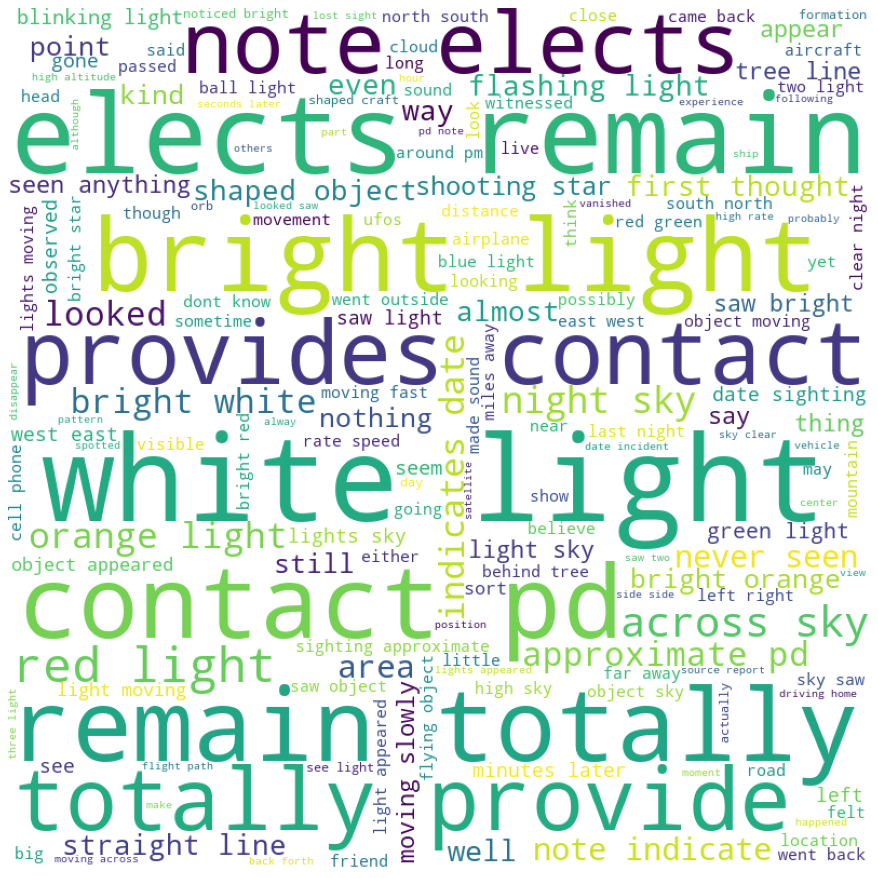

In [920]:
# Create wordcloud
text = ' '.join(df['text_clean'])

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',  
                min_font_size = 10).generate(text) 
                     
plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

#### Answer

The most common words used to describe the UFO sightings' phenomenon are **lights** (which makes sense, as it's the most common shape observed), which are described as **bright, white, orange, red, green**. Seems that UFOs can be of various colours.

Spotted UFOs can move both **fast** and **slowly**.

Moreover, there are frequently occurring words and expressions that are quite generic, such as **kind, thing, approximate, sort, almost, possibly, don't know**. Meaning that people that experienced UFO sightings may struggle in describing what they have seen.